<h1><center>Churn Prediction (Statistical Testing, Stacking Ensemble) </center></h1>

<center><img src="https://uploads-ssl.webflow.com/60d45d63543dd9baaad4cb28/60d85fd90743e2299c711be5_1%20dqSLRSEC2GDV9bw_PplCYQ.png" align="center"/></center>

<a id='10'></a>
# 10 Modeling

<a id='10.1'></a>
## 10.1 Utility Function

<a id='10.1.1'></a>
### 10.1.1 Training

In [99]:
def train_model(model, model_name, X, y, X_test, fold):
  printmd(f'**{model_name} Init**')
  auc_scores = []

  test_preds=None

  strat_kf = StratifiedKFold(n_splits=fold, random_state=SEED, shuffle=True)

  for fold, (train_index, valid_index) in enumerate(strat_kf.split(X, y)):
    X_train, X_valid = X.iloc[train_index] , X.iloc[valid_index]
    y_train, y_valid = y[train_index] , y[valid_index]


    #### to SMOTE sampling
    # sm = SMOTE(sampling_strategy='all', random_state=SEED)
    # X_train_oversampled, y_train_oversampled = sm.fit_resample(X_train, y_train)
    # X_val_oversampled, y_val_oversampled = sm.fit_resample(X_valid, y_valid)
 
    eval_set = [(X_valid, y_valid)]

    print("-" * 50)
    print(f"Fold {fold + 1}")

    if model_name == 'cat':
      model.fit(X_train, y_train, eval_set= eval_set)
    elif model_name == 'xgb':
    # eval_metric is already in xgb_params; don't pass it to fit() on xgboost>=2.0
      model.fit(
        X_train, y_train,
        eval_set=eval_set,
        callbacks=[EarlyStopping(rounds=200, save_best=True)]
    )

    else:
      model.fit(X_train, y_train, eval_set= eval_set, eval_metric = 'auc', early_stopping_rounds = 200)
    

    val_pred = model.predict_proba(X_valid)[:,1]
    auc = roc_auc_score(y_valid, val_pred) # AUROC requires probabilities of the predictions
    print("AUC Score : ",auc)

    auc_scores.append(auc)

    if test_preds is None:
      test_preds = model.predict_proba(X_test)[:,1] 
    else:
      test_preds += model.predict_proba(X_test)[:,1] 


    del X_train, y_train, X_valid, y_valid
    gc.collect()
      
  print("-" * 50)
  test_preds /= fold

  print(f'Train : Base Model - {model_name} - AUC score : mean ---> {np.mean(auc_scores)}, std ---> {np.std(auc_scores)}')
  
  # evaluation on test set
  print(f'Test  : Base Model - {model_name} - AUC score : {roc_auc_score(y_test, test_preds)}')

  del test_preds
  gc.collect()
  
  print('Done!')

  if model_name == 'cat':
    plot_feature_importance(model.get_feature_importance(), X.columns, model_name)
    model.save_model("model_catboost")

  elif model_name == 'xgb':
    plot_feature_importance(model.feature_importances_, X.columns, model_name)

    # https://xgboost.readthedocs.io/en/latest/tutorials/saving_model.html
    # save the model
    model.save_model('model_xgb.json')

  else:
    plot_feature_importance(model.feature_importances_, X.columns, model_name)
    model.booster_.save_model('model_lgbm.txt') 
    joblib.dump(model, 'model_lgbm.pkl')
    # shap_values = shap.TreeExplainer(model.booster_).shap_values(X_train)



<a id='10.1.2'></a>
### 10.1.2 Model Interpretation

In [100]:
# https://www.analyseup.com/learn-python-for-data-science/python-random-forest-feature-importance-plot.html

def plot_feature_importance(importance,names,model_type):

  #Create arrays from feature importance and feature names
  feature_importance = np.array(importance)
  feature_names = np.array(names)

  #Create a DataFrame using a Dictionary
  data={'feature_names':feature_names,'feature_importance':feature_importance}
  fi_df = pd.DataFrame(data)

  #Sort the DataFrame in order decreasing feature importance
  fi_df.sort_values(by=['feature_importance'], ascending=False,inplace=True)

  #Define size of bar plot
  plt.figure(figsize=(10,8),dpi=100)
  #Plot Searborn bar chart
  sns.barplot(x=fi_df['feature_importance'], y=fi_df['feature_names'])
  #Add chart labels
  plt.title(model_type + ' FEATURE IMPORTANCE')
  plt.xlabel('FEATURE IMPORTANCE')
  plt.ylabel('FEATURE NAMES')

# credit : https://www.analyseup.com/learn-python-for-data-science/python-random-forest-feature-importance-plot.html

<a id='10.2'></a>
## 10.2 Catboost

<a id='10.2.1'></a>
### 10.2.1 Training

**cat Init**

--------------------------------------------------
Fold 1
0:	test: 0.5000000	best: 0.5000000 (0)	total: 248ms	remaining: 28m 31s
1:	test: 0.5000000	best: 0.5000000 (0)	total: 251ms	remaining: 14m 23s
2:	test: 0.5000000	best: 0.5000000 (0)	total: 253ms	remaining: 9m 40s
3:	test: 0.5000000	best: 0.5000000 (0)	total: 255ms	remaining: 7m 18s
4:	test: 0.5000000	best: 0.5000000 (0)	total: 256ms	remaining: 5m 52s
5:	test: 0.5000000	best: 0.5000000 (0)	total: 258ms	remaining: 4m 55s
6:	test: 0.5000000	best: 0.5000000 (0)	total: 260ms	remaining: 4m 15s
7:	test: 0.5000000	best: 0.5000000 (0)	total: 262ms	remaining: 3m 45s
8:	test: 0.5742995	best: 0.5742995 (8)	total: 267ms	remaining: 3m 24s
9:	test: 0.5742995	best: 0.5742995 (8)	total: 269ms	remaining: 3m 4s
10:	test: 0.5742995	best: 0.5742995 (8)	total: 270ms	remaining: 2m 49s
11:	test: 0.5742995	best: 0.5742995 (8)	total: 272ms	remaining: 2m 35s
12:	test: 0.5742995	best: 0.5742995 (8)	total: 274ms	remaining: 2m 24s
13:	test: 0.5742995	best: 0.

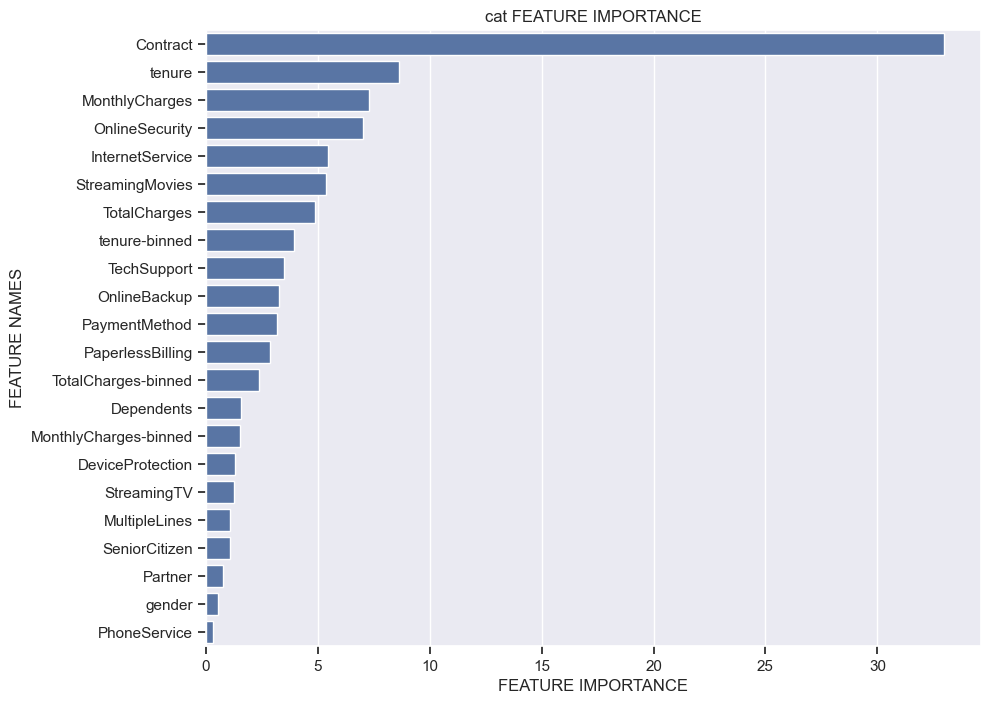

In [101]:
%%time
# https://catboost.ai/en/docs/concepts/speed-up-training

# this dataset is fairly small so catboost runs super slow on GPU
# https://github.com/catboost/catboost/issues/1034


fold_num = 10

# convert datatype to integer to use 'cat_features' parameter
# does not improve score
# for c in cat_cols:
#     X[c] = X[c].astype(np.int)
#     X_test[c] = X_test[c].astype(np.int)

cat_params  = {
    'eval_metric':"AUC",
    'loss_function': 'logloss',
    'objective': 'Logloss',
    'boosting_type': 'Plain',
    'bootstrap_type': 'Bayesian', 
    'colsample_bylevel': 0.013457968759952536, # does not support on gpu https://catboost.ai/en/docs/references/training-parameters/common#rsm
    'depth': 6,
    'iterations': 6888,
    'learning_rate': 0.05683590866750785,
    'random_strength': 18, 
    'l2_leaf_reg': 50,
    'random_state': SEED,
    # 'task_type':"GPU",
    'devices' : '0',
    # 'cat_features':cat_cols
    }


cat = CatBoostClassifier(**cat_params)

train_model(cat, 'cat', X, y, X_test, fold_num)


# After tune with catboost 200 trial+all featuer + standard scaler Best tuning Score:  0.8414050995892428

# Train : Base Model - cat - AUC score : mean ---> 0.8511173638199994, std ---> 0.01460379925370074
# Test  : Base Model - cat - AUC score : 0.8472435350951975

In [102]:
# ==== Load (if needed) + Clean + One-hot + Split ====
import pandas as pd
from sklearn.model_selection import train_test_split
import numpy as np

SEED = 42

# 1) Load base dataframe if not already present
if 'df_churn' not in globals():
    df_churn = pd.read_csv(
        "https://raw.githubusercontent.com/IBM/telco-customer-churn-on-icp4d/master/data/Telco-Customer-Churn.csv"
    )

# 2) Basic cleaning
df = df_churn.copy()

# Ensure numeric where needed
if 'TotalCharges' in df.columns:
    df['TotalCharges'] = pd.to_numeric(df['TotalCharges'], errors='coerce')

# Drop obvious ID col if present
for c in ['customerID', 'CustomerID', 'CustomerId']:
    if c in df.columns:
        df.drop(columns=[c], inplace=True)

# TARGET -> 0/1 BEFORE encoding
df['Churn'] = df['Churn'].astype(str).str.strip().str.lower().eq('yes').astype('int8')

# 3) One-hot encode features (exclude target)
features = df.drop(columns=['Churn'])
df_churn_ohe = pd.get_dummies(features, drop_first=True)

# 4) Build X, y and split (now y is guaranteed numeric)
X_full = df_churn_ohe
y_full = df['Churn'].values

X, X_test, y, y_test = train_test_split(
    X_full, y_full, test_size=0.2, stratify=y_full, random_state=SEED
)

print("df_churn_ohe:", df_churn_ohe.shape, "| Train:", X.shape, "| Test:", X_test.shape)


df_churn_ohe: (7043, 36) | Train: (5634, 36) | Test: (1409, 36)


<a id='10.2.2'></a>
### 10.2.2 Optuna Tuning

In [103]:
%%time
def objective(trial):
    # train/valid split
    X_train, X_test, y_train, y_test = train_test_split(
        X, y, test_size=0.25, random_state=int(SEED), shuffle=True, stratify=y
    )

    # hyperparams (Optuna v4: use suggest_float(..., log=True) instead of suggest_loguniform)
    params = {
        'iterations'      : trial.suggest_int('iterations', 600, 1200),
        'depth'           : trial.suggest_int('depth', 4, 8),
        'learning_rate'   : trial.suggest_float('learning_rate', 1e-3, 1e-1, log=True),
        'l2_leaf_reg'     : trial.suggest_float('l2_leaf_reg', 1.0, 50.0),
        'colsample_bylevel': trial.suggest_float('colsample_bylevel', 0.05, 0.8),
        'random_strength' : trial.suggest_float('random_strength', 0.0, 1.0),
        'boosting_type'   : trial.suggest_categorical('boosting_type', ['Ordered', 'Plain']),
        'bootstrap_type'  : trial.suggest_categorical('bootstrap_type', ['Bayesian', 'Bernoulli', 'MVS']),
        'loss_function'   : 'Logloss',
        'eval_metric'     : 'AUC',
        'random_seed'     : int(SEED),
        'task_type'       : 'CPU'
    }

    # required extras depending on bootstrap_type
    if params['bootstrap_type'] == 'Bayesian':
        params['bagging_temperature'] = trial.suggest_float('bagging_temperature', 0.0, 10.0)
    elif params['bootstrap_type'] == 'Bernoulli':
        params['subsample'] = trial.suggest_float('subsample', 0.5, 1.0)

    model = CatBoostClassifier(**params)

    model.fit(
        X_train, y_train,
        eval_set=(X_test, y_test),
        early_stopping_rounds=100,
        use_best_model=True
    )

    val_preds = model.predict_proba(X_test)[:, 1]
    return roc_auc_score(y_test, val_preds)


CPU times: total: 0 ns
Wall time: 0 ns


In [104]:
# Make sure these exist ONCE before tuning
# If your OHE dataframe is features-only:
#   X = df_churn_ohe
#   y = df['Churn'].astype(int).values
# If your OHE includes the target, then do:
#   X = df_churn_ohe.drop(columns=['Churn'])
#   y = df_churn_ohe['Churn'].astype(int).values

from sklearn.model_selection import train_test_split
from sklearn.metrics import roc_auc_score
from catboost import CatBoostClassifier

SEED = 42

def objective(trial):
    params = {
        'iterations'     : trial.suggest_int('iterations', 400, 1200),
        'depth'          : trial.suggest_int('depth', 4, 8),
        'learning_rate'  : trial.suggest_float('learning_rate', 0.01, 0.2, log=True),
        'l2_leaf_reg'    : trial.suggest_float('l2_leaf_reg', 1.0, 50.0),
        'subsample'      : trial.suggest_float('subsample', 0.6, 1.0),
        'random_strength': trial.suggest_float('random_strength', 0.0, 1.0),
        'loss_function'  : 'Logloss',
        'eval_metric'    : 'AUC',
        'task_type'      : 'CPU',
        'random_seed'    : SEED,
    }

    X_train, X_valid, y_train, y_valid = train_test_split(
        X, y, test_size=0.2, stratify=y, random_state=SEED
    )

    model = CatBoostClassifier(**params)
    model.fit(
        X_train, y_train,
        eval_set=(X_valid, y_valid),
        early_stopping_rounds=100,
        use_best_model=True,
    )

    preds = model.predict_proba(X_valid)[:, 1]
    return roc_auc_score(y_valid, preds)


In [105]:
%%time
n_trials = 50

study = optuna.create_study(
    direction="maximize",
    sampler=optuna.samplers.TPESampler(seed=SEED)
)
study.optimize(objective, n_trials=n_trials, n_jobs=1, show_progress_bar=True)

printmd('**BEST TRIAL**')
print("Best Score: ", study.best_value)
printmd('**CatBoost Tuned Hyperparameters**')
pprint.pprint(study.best_trial.params)


[I 2025-10-02 19:47:32,803] A new study created in memory with name: no-name-727f9fd6-e642-4b32-b920-d43b55ea22a6


  0%|          | 0/50 [00:00<?, ?it/s]

0:	test: 0.8292376	best: 0.8292376 (0)	total: 35.5ms	remaining: 24.8s
1:	test: 0.8412583	best: 0.8412583 (1)	total: 44.4ms	remaining: 15.5s
2:	test: 0.8439888	best: 0.8439888 (2)	total: 51.5ms	remaining: 12s
3:	test: 0.8425811	best: 0.8439888 (2)	total: 58.6ms	remaining: 10.2s
4:	test: 0.8429366	best: 0.8439888 (2)	total: 66.5ms	remaining: 9.24s
5:	test: 0.8432557	best: 0.8439888 (2)	total: 73.5ms	remaining: 8.5s
6:	test: 0.8445139	best: 0.8445139 (6)	total: 81.5ms	remaining: 8.07s
7:	test: 0.8438777	best: 0.8445139 (6)	total: 88.5ms	remaining: 7.66s
8:	test: 0.8444170	best: 0.8445139 (6)	total: 97.7ms	remaining: 7.5s
9:	test: 0.8442978	best: 0.8445139 (6)	total: 105ms	remaining: 7.24s
10:	test: 0.8463821	best: 0.8463821 (10)	total: 113ms	remaining: 7.09s
11:	test: 0.8471414	best: 0.8471414 (11)	total: 120ms	remaining: 6.89s
12:	test: 0.8481008	best: 0.8481008 (12)	total: 128ms	remaining: 6.79s
13:	test: 0.8475635	best: 0.8481008 (12)	total: 136ms	remaining: 6.68s
14:	test: 0.8473151	b

**BEST TRIAL**

Best Score:  0.8552784644467064


**CatBoost Tuned Hyperparameters**

{'depth': 5,
 'iterations': 962,
 'l2_leaf_reg': 11.258469009046246,
 'learning_rate': 0.09441179104895667,
 'random_strength': 0.9179795804366565,
 'subsample': 0.9045921070303294}
CPU times: total: 6min 25s
Wall time: 1min 32s


In [106]:
# Save
pickle.dump(study.best_trial.params, open('CatBoost_Hyperparameter.pickle', 'wb'))
print("Best Score: ", study.best_value)

printmd('**CatBoost Tuned Hyperparameters**')
pprint.pprint(study.best_trial.params)

# history
display(optuna.visualization.plot_optimization_history(study))

# Importance
display(plot_param_importances(study))

Best Score:  0.8552784644467064


**CatBoost Tuned Hyperparameters**

{'depth': 5,
 'iterations': 962,
 'l2_leaf_reg': 11.258469009046246,
 'learning_rate': 0.09441179104895667,
 'random_strength': 0.9179795804366565,
 'subsample': 0.9045921070303294}


<a id='10.3'></a>
## 10.3 XGBoost

<a id='10.3.1'></a>
### 10.3.1 Training


<a id='10.3.2'></a>
### 10.3.2 Optuna Tuning

In [107]:
%%time
def objective(trial):
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25, random_state=int(SEED), shuffle=True, stratify=y)

    params  = {
          'n_estimators': trial.suggest_categorical('n_estimators',[10000]),  
          'learning_rate': trial.suggest_float('learning_rate',1e-3,5e-1,log=True),
          'max_depth': trial.suggest_int('max_depth',3,12),
          'colsample_bytree': trial.suggest_float('colsample_bytree',0.2,0.99,log=True),
          'subsample': trial.suggest_float('subsample',0.2,0.99,log=True),
          'eval_metric': trial.suggest_categorical('eval_metric',['auc']),
          'use_label_encoder':trial.suggest_categorical('use_label_encoder',[False]),
          'gamma': trial.suggest_categorical('gamma',[0, 0.25, 0.5, 1.0]),
          'reg_lambda': trial.suggest_categorical('reg_lambda',[0.1, 1.0, 5.0, 10.0, 50.0, 100.0]),
          'tree_method': trial.suggest_categorical('tree_method',['gpu_hist']),
          'gpu_id': trial.suggest_categorical('gpu_id',[0]),
          'predictor' : trial.suggest_categorical('predictor',['gpu_predictor']),
          'random_state': trial.suggest_categorical('random_state',[SEED])
         }

    # learning
    model = XGBClassifier(**params)        
    model.fit(X_train, y_train) # 1000
    val_preds = model.predict_proba(X_test)[:,1]
    auc = roc_auc_score(y_test, val_preds) # AUROC requires probabilities of the predictions
    # print("AUC Score : ",auc) # check the auc score in each trial
    
    return auc

CPU times: total: 0 ns
Wall time: 0 ns


In [108]:
# Save
pickle.dump(study.best_trial.params, open('XGB_Hyperparameter.pickle', 'wb'))
print("Best Score: ", study.best_value)

printmd('**XGBoost Tuned Hyperparameters**')
pprint.pprint(study.best_trial.params)


# history
display(optuna.visualization.plot_optimization_history(study))

# Importance
display(plot_param_importances(study))

Best Score:  0.8552784644467064


**XGBoost Tuned Hyperparameters**

{'depth': 5,
 'iterations': 962,
 'l2_leaf_reg': 11.258469009046246,
 'learning_rate': 0.09441179104895667,
 'random_strength': 0.9179795804366565,
 'subsample': 0.9045921070303294}


<a id='10.4'></a>
## 10.4 LGBM

<a id='10.4.1'></a>
### 10.4.1 Training

<a id='10.4.2'></a>
### 10.4.2 Optuna Tuning

In [ ]:

import pandas as pd
try:
    df_churn
except NameError:
    df_churn = pd.read_csv(
        "https://raw.githubusercontent.com/IBM/telco-customer-churn-on-icp4d/master/data/Telco-Customer-Churn.csv"
    )

# --- PREP: binary target + one-hot (idempotent) ---
df_churn_cleaned = df_churn.copy()
df_churn_cleaned['Churn'] = (
    df_churn_cleaned['Churn'].astype(str).str.strip().str.lower().eq('yes')
).astype('int8')

df_churn_ohe = pd.get_dummies(df_churn_cleaned, drop_first=True)
df_churn_ohe.drop(columns=[
    'MultipleLines_No phone service',
    'OnlineSecurity_No internet service',
    'OnlineBackup_No internet service',
    'DeviceProtection_No internet service',
    'TechSupport_No internet service',
    'StreamingTV_No internet service',
    'StreamingMovies_No internet service'
], errors='ignore', inplace=True)

# Features/target for modeling
X = df_churn_ohe.drop(columns=['Churn'])
y = df_churn_ohe['Churn'].values

print("Prepared:", X.shape, "Target:", y.shape)


Prepared: (7043, 29) Target: (7043,)


In [110]:
from sklearn.model_selection import train_test_split
from sklearn.metrics import roc_auc_score
from catboost import CatBoostClassifier
import optuna

SEED = 42

def objective(trial):
    params = {
        'iterations'     : trial.suggest_int('iterations', 400, 1200),
        'depth'          : trial.suggest_int('depth', 4, 8),
        'learning_rate'  : trial.suggest_float('learning_rate', 0.01, 0.2, log=True),
        'l2_leaf_reg'    : trial.suggest_float('l2_leaf_reg', 1.0, 50.0),
        'subsample'      : trial.suggest_float('subsample', 0.6, 1.0),
        'random_strength': trial.suggest_float('random_strength', 0.0, 1.0),
        'loss_function'  : 'Logloss',
        'eval_metric'    : 'AUC',
        'task_type'      : 'CPU',
        'random_seed'    : SEED,
    }

    X_train, X_valid, y_train, y_valid = train_test_split(
        X, y, test_size=0.2, stratify=y, random_state=SEED
    )

    model = CatBoostClassifier(**params)
    model.fit(
        X_train, y_train,
        eval_set=(X_valid, y_valid),
        early_stopping_rounds=100,
        use_best_model=True,
    )

    preds = model.predict_proba(X_valid)[:, 1]
    return roc_auc_score(y_valid, preds)


In [111]:
%%time
import optuna, pprint, multiprocessing

SEED = 42
n_trials = 50  # reduced for stability; raise if resources allow

# set logging level directly (avoid undefined optuna_verbosity)
optuna.logging.set_verbosity(optuna.logging.WARNING)

study = optuna.create_study(
    direction="maximize",
    sampler=optuna.samplers.TPESampler(seed=SEED)
)

# run sequentially to reduce RAM/CPU contention
study.optimize(objective, n_trials=n_trials, n_jobs=1, show_progress_bar=True)

printmd('**BEST TRIAL**')
print("Best Score: ", study.best_value)
printmd('**LGBM Tuned Hyperparameters**')
pprint.pprint(study.best_trial.params)


  0%|          | 0/50 [00:00<?, ?it/s]

0:	test: 0.8202989	best: 0.8202989 (0)	total: 7.16ms	remaining: 5.01s
1:	test: 0.8314643	best: 0.8314643 (1)	total: 15.7ms	remaining: 5.46s
2:	test: 0.8350719	best: 0.8350719 (2)	total: 23.4ms	remaining: 5.43s
3:	test: 0.8380609	best: 0.8380609 (3)	total: 32.6ms	remaining: 5.67s
4:	test: 0.8416996	best: 0.8416996 (4)	total: 39.3ms	remaining: 5.46s
5:	test: 0.8439549	best: 0.8439549 (5)	total: 47.8ms	remaining: 5.53s
6:	test: 0.8433995	best: 0.8439549 (5)	total: 54.7ms	remaining: 5.42s
7:	test: 0.8416479	best: 0.8439549 (5)	total: 62.6ms	remaining: 5.41s
8:	test: 0.8419915	best: 0.8439549 (5)	total: 69.5ms	remaining: 5.34s
9:	test: 0.8424940	best: 0.8439549 (5)	total: 76.3ms	remaining: 5.27s
10:	test: 0.8428014	best: 0.8439549 (5)	total: 84.5ms	remaining: 5.29s
11:	test: 0.8442894	best: 0.8442894 (11)	total: 91.2ms	remaining: 5.23s
12:	test: 0.8439859	best: 0.8442894 (11)	total: 99.3ms	remaining: 5.25s
13:	test: 0.8438503	best: 0.8442894 (11)	total: 106ms	remaining: 5.2s
14:	test: 0.844

**BEST TRIAL**

Best Score:  0.8502234622439226


**LGBM Tuned Hyperparameters**

{'depth': 6,
 'iterations': 1057,
 'l2_leaf_reg': 40.61182280017588,
 'learning_rate': 0.03304536154506239,
 'random_strength': 0.9149344855229979,
 'subsample': 0.7163239096021328}
CPU times: total: 6min 50s
Wall time: 1min 41s


In [112]:
# Save
pickle.dump(study.best_trial.params, open('LGBM_Hyperparameter.pickle', 'wb'))
print("Best Score: ", study.best_value)
printmd('**LGBM Tuned Hyperparameters**')
pprint.pprint(study.best_trial.params)

# history
display(optuna.visualization.plot_optimization_history(study))

# Importance
display(plot_param_importances(study))

Best Score:  0.8502234622439226


**LGBM Tuned Hyperparameters**

{'depth': 6,
 'iterations': 1057,
 'l2_leaf_reg': 40.61182280017588,
 'learning_rate': 0.03304536154506239,
 'random_strength': 0.9149344855229979,
 'subsample': 0.7163239096021328}


<a id='10.5'></a>
## 10.5 Stacking Ensemble

---
![image.png](http://rasbt.github.io/mlxtend/user_guide/classifier/StackingClassifier_files/stackingclassification_overview.png)

In [113]:
def stacking_data_loader(model, model_name, train, y, test, fold):
    '''
    input train, test datasets and fold value!
    returns train, test datasets for stacking ensemble
    '''

    stk = StratifiedKFold(n_splits = fold, random_state = SEED, shuffle = True)
    
    # Declaration Pred Datasets
    train_fold_pred = np.zeros((train.shape[0], 1))
    test_pred = np.zeros((test.shape[0], fold))
    
    for counter, (train_index, valid_index) in enumerate(stk.split(train, y)):
        X_train, y_train = train.iloc[train_index], y[train_index]
        X_valid, y_valid = train.iloc[valid_index], y[valid_index]

        print('------------ Fold', counter+1, 'Start! ------------')
        if model_name == 'cat':
            model.fit(X_train, y_train, eval_set=[(X_valid, y_valid)])
        elif model_name == 'xgb':
            model.fit(X_train, y_train, eval_set=[(X_valid, y_valid)], eval_metric = 'auc', early_stopping_rounds = 200)
        else:
            model.fit(X_train, y_train, eval_set=[(X_valid, y_valid)], eval_metric = 'auc', early_stopping_rounds = 200)
            
        print('------------ Fold', counter+1, 'Done! ------------')
        
        train_fold_pred[valid_index, :] = model.predict_proba(X_valid)[:, 1].reshape(-1, 1)
        test_pred[:, counter] = model.predict_proba(test)[:, 1]
        del X_train, y_train, X_valid, y_valid
        gc.collect()
        
    test_pred_mean = np.mean(test_pred, axis = 1).reshape(-1, 1)
    
    del test_pred
    gc.collect()
    
    print('Done!')
    
    return train_fold_pred, test_pred_mean

In [114]:
from sklearn.model_selection import train_test_split

SEED = 42

# Build features/target from your prepared dataframe
X_full = df_churn_ohe.drop(columns=['Churn'])
y_full = df_churn_ohe['Churn'].astype(int).values

# Create train/hold-out; keep names X, y for training and X_test for hold-out
X, X_test, y, y_test = train_test_split(
    X_full, y_full, test_size=0.2, stratify=y_full, random_state=SEED
)

print("Train:", X.shape, " Test:", X_test.shape)


Train: (5634, 29)  Test: (1409, 29)


In [115]:
# Install (only if needed) into the *current kernel/venv*
import sys, subprocess
subprocess.check_call([sys.executable, "-m", "pip", "install", "lightgbm", "xgboost", "catboost"])

# Imports for the three models you use
from lightgbm import LGBMClassifier
from xgboost import XGBClassifier
from catboost import CatBoostClassifier


<a id='10.5.1'></a>
### 10.5.1 Level 0 : Base Models

In [ ]:
# --- Imports (models + tools) ---
from lightgbm import LGBMClassifier
from xgboost import XGBClassifier
from catboost import CatBoostClassifier
from sklearn.model_selection import train_test_split, StratifiedKFold
from sklearn.metrics import roc_auc_score
import numpy as np, gc

SEED = 42

# --- Helper for stacking: returns OOF preds (train) and averaged test preds ---
def stacking_data_loader(model, model_name, X, y, X_test, n_folds=5, random_state=SEED):
    oof = np.zeros(X.shape[0], dtype=float)
    tst = np.zeros(X_test.shape[0], dtype=float)
    skf = StratifiedKFold(n_splits=n_folds, shuffle=True, random_state=random_state)

    for i, (tr, va) in enumerate(skf.split(X, y), 1):
        X_tr, X_va = X.iloc[tr], X.iloc[va]
        y_tr, y_va = y[tr], y[va]

        # Fit with eval_set when available; silence verbose
        fit_kwargs = {}
        if hasattr(model, "fit"):
            if "eval_set" in model.fit.__code__.co_varnames:
                fit_kwargs["eval_set"] = [(X_va, y_va)]
            

        model.fit(X_tr, y_tr, **fit_kwargs)
        oof[va] = model.predict_proba(X_va)[:, 1]
        tst += model.predict_proba(X_test)[:, 1] / n_folds

        try:
            auc = roc_auc_score(y_va, oof[va])
            print(f"[{model_name}] fold {i} AUC: {auc:.4f}")
        except Exception:
            print(f"[{model_name}] fold {i} done.")

    return oof.reshape(-1, 1), tst.reshape(-1, 1)

# --- Ensure X, y, X_test exist (build from df_churn_ohe if needed) ---
if "X" not in globals() or "y" not in globals() or "X_test" not in globals():
    if "df_churn_ohe" not in globals():
        raise NameError("df_churn_ohe is not defined. Create it first, with a binary 'Churn' column.")
    X_full = df_churn_ohe.drop(columns=["Churn"])
    y_full = df_churn_ohe["Churn"].astype(int).values
    X, X_test, y, y_test = train_test_split(
        X_full, y_full, test_size=0.2, stratify=y_full, random_state=SEED
    )
    print("Split made — Train:", X.shape, " Test:", X_test.shape)

# --- Your tuned params (kept as-is) ---
lgbm_params = {
    'n_estimators': 12749,
    'learning_rate': 0.1985328656822506,
    'reg_alpha': 9.77289653841389,
    'reg_lambda': 4.979048257991328,
    'num_leaves': 921,
    'min_child_samples': 85,
    'max_depth': 56,
    'colsample_bytree': 0.43848926369957975,
    'cat_smooth': 92,
    'cat_l2': 17,
    'min_data_per_group': 59,
    'random_state': SEED
}
lgbm = LGBMClassifier(**lgbm_params)

xgb_params = {
    'colsample_bytree': 0.2645340949128848,
    'eval_metric': 'auc',
    'gamma': 0,
    'learning_rate': 0.001851851953410451,
    'max_depth': 3,
    'n_estimators': 6000,
    'random_state': SEED,
    'reg_lambda': 0.1,
    'subsample': 0.6905005604726816,
    'use_label_encoder': False
}
xgb = XGBClassifier(**xgb_params)

cat_params = {
    'eval_metric': "AUC",
    'loss_function': 'Logloss',          # keep only loss_function; removed duplicate 'objective'
    'boosting_type': 'Plain',
    'bootstrap_type': 'Bayesian',
    'colsample_bylevel': 0.013457968759952536,
    'depth': 6,
    'iterations': 6888,
    'learning_rate': 0.05683590866750785,
    'random_strength': 18,
    'l2_leaf_reg': 50,
    'random_state': SEED
}
cat = CatBoostClassifier(**cat_params)

# --- Run stacking for each model ---
fold_num = 5

cat_train,  cat_test  = stacking_data_loader(cat,  'cat',  X, y, X_test, fold_num)
del cat; gc.collect()

lgbm_train, lgbm_test = stacking_data_loader(lgbm, 'lgbm', X, y, X_test, fold_num)
del lgbm; gc.collect()

xgb_train,  xgb_test  = stacking_data_loader(xgb,  'xgb',  X, y, X_test, fold_num)
del xgb; gc.collect()

print("Shapes — cat:", cat_train.shape, cat_test.shape,
      "| lgbm:", lgbm_train.shape, lgbm_test.shape,
      "| xgb:", xgb_train.shape, xgb_test.shape)


0:	test: 0.5000000	best: 0.5000000 (0)	total: 1.89ms	remaining: 13s
1:	test: 0.5000000	best: 0.5000000 (0)	total: 3.5ms	remaining: 12s
2:	test: 0.5000000	best: 0.5000000 (0)	total: 5.04ms	remaining: 11.6s
3:	test: 0.5000000	best: 0.5000000 (0)	total: 6.56ms	remaining: 11.3s
4:	test: 0.5000000	best: 0.5000000 (0)	total: 8.11ms	remaining: 11.2s
5:	test: 0.5000000	best: 0.5000000 (0)	total: 10.3ms	remaining: 11.8s
6:	test: 0.5227146	best: 0.5227146 (6)	total: 12ms	remaining: 11.8s
7:	test: 0.5227146	best: 0.5227146 (6)	total: 13.6ms	remaining: 11.7s
8:	test: 0.5227146	best: 0.5227146 (6)	total: 15.2ms	remaining: 11.6s
9:	test: 0.5458210	best: 0.5458210 (9)	total: 16.8ms	remaining: 11.6s
10:	test: 0.5458210	best: 0.5458210 (9)	total: 18.4ms	remaining: 11.5s
11:	test: 0.5458210	best: 0.5458210 (9)	total: 19.9ms	remaining: 11.4s
12:	test: 0.5458210	best: 0.5458210 (9)	total: 21.4ms	remaining: 11.3s
13:	test: 0.5458210	best: 0.5458210 (9)	total: 22.9ms	remaining: 11.3s
14:	test: 0.5458210	bes

<a id='10.5.2'></a>
### 10.5.2 Stacking Datasets

In [ ]:
stack_X_train = np.concatenate((cat_train, lgbm_train, xgb_train), axis = 1)
stack_X_test = np.concatenate((cat_test, lgbm_test, xgb_test), axis = 1)

del cat_train, lgbm_train, xgb_train, cat_test, lgbm_test, xgb_test
gc.collect()

stack_X_train.shape, stack_X_test.shape

((5634, 3), (1409, 3))

<a id='10.5.3'></a>
### 10.5.3 Level 1 : Meta Model

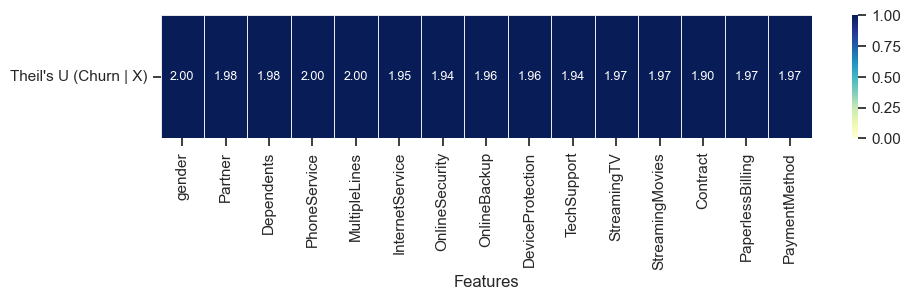

In [ ]:


import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from collections import Counter

# --- helpers (redeclared here so the cell is self-contained) ---
def _conditional_entropy(x, y):
    # align & drop NaNs
    s = pd.DataFrame({'x': x, 'y': y}).dropna()
    x = s['x'].astype(str)
    y = s['y'].astype(str)

    y_counter  = Counter(y)
    xy_counter = Counter(zip(x, y))
    total      = len(s)

    ent = 0.0
    for (xi, yi), n_xy in xy_counter.items():
        p_xy = n_xy / total
        p_y  = y_counter[yi] / total
        ent += p_xy * np.log(p_y / p_xy)
    return -ent

def theils_u(x, y):
    """U(X|Y) = (H(X) − H(X|Y)) / H(X).  0 ≤ U ≤ 1."""
    x_series = pd.Series(x).dropna().astype(str)
    if x_series.empty:
        return np.nan
    p_x = x_series.value_counts(normalize=True)
    h_x = - (p_x * np.log(p_x)).sum()
    if h_x == 0:
        return 1.0
    return (h_x - _conditional_entropy(x, y)) / h_x

# --- build `theilu` if it doesn't exist yet ---
try:
    theilu
except NameError:
    polytomous_cols = [c for c in df_churn.columns
                       if c != 'Churn' and df_churn[c].dtype == 'object']
    theilu = pd.DataFrame(index=['Churn'], columns=polytomous_cols, dtype=float)
    for col in polytomous_cols:
        theilu.loc['Churn', col] = theils_u(df_churn[col], df_churn['Churn'])

# ensure numeric & clean
theilu = (theilu.apply(pd.to_numeric, errors='coerce')
                 .astype(float)
                 .replace([np.inf, -np.inf], np.nan))

# --- plot ---
plt.figure(figsize=(max(8, 0.7 * theilu.shape[1]), 1.6))
ax = sns.heatmap(
    theilu,
    annot=True, fmt='.2f',
    cmap="YlGnBu",
    vmin=0, vmax=1, cbar=True,
    linewidths=0.4, linecolor='#e5e7eb',
    annot_kws={'size': 9}
)
ax.set_xlabel("Features")
ax.set_ylabel("")
ax.set_yticklabels(["Theil's U (Churn | X)"], rotation=0)
plt.tight_layout()
plt.show()


In [ ]:
from sklearn.model_selection import train_test_split

# Assuming your features are in X and labels in y
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, stratify=y, random_state=SEED
)


In [ ]:

import numpy as np
import pandas as pd
from sklearn.model_selection import StratifiedKFold
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier, ExtraTreesClassifier

# ---- sanity checks: expect train/test split to exist ----
missing = [v for v in ("X_train", "X_test", "y_train", "y_test") if v not in globals()]
if missing:
    raise NameError(f"[Cell 140] Missing: {', '.join(missing)}. Run the split cell first (e.g., 138).")

SEED = globals().get("SEED", 42)

# Ensure expected types (pandas-friendly with .iloc)
if isinstance(X_train, np.ndarray):
    X_train = pd.DataFrame(X_train)
if isinstance(X_test, np.ndarray):
    X_test = pd.DataFrame(X_test)
if not isinstance(y_train, pd.Series):
    y_train = pd.Series(y_train)

X_train = X_train.reset_index(drop=True)
X_test  = X_test.reset_index(drop=True)
y_train = y_train.reset_index(drop=True)

# ---- choose 3 robust sklearn base models (no extra libraries required) ----
base_models = [
    ("rf",  RandomForestClassifier(n_estimators=400, random_state=SEED, n_jobs=-1)),
    ("gbc", GradientBoostingClassifier(random_state=SEED)),
    ("et",  ExtraTreesClassifier(n_estimators=500, random_state=SEED, n_jobs=-1)),
]
n_base = len(base_models)

# ---- out-of-fold framework ----
folds = 5
cv = StratifiedKFold(n_splits=folds, shuffle=True, random_state=SEED)

stack_X_train = np.zeros((X_train.shape[0], n_base), dtype=float)
stack_X_test  = np.zeros((X_test.shape[0],  n_base), dtype=float)

for m_idx, (name, model) in enumerate(base_models):
    # collect test preds from each fold to average later
    test_fold_preds = np.zeros((X_test.shape[0], folds), dtype=float)

    for fold_idx, (tr_idx, va_idx) in enumerate(cv.split(X_train, y_train), start=1):
        X_tr = X_train.iloc[tr_idx]; y_tr = y_train.iloc[tr_idx]
        X_va = X_train.iloc[va_idx]; y_va = y_train.iloc[va_idx]

        model.fit(X_tr, y_tr)

        # OOF predictions fill the correct validation rows
        stack_X_train[va_idx, m_idx] = model.predict_proba(X_va)[:, 1]

        # test preds for this fold, will be averaged
        test_fold_preds[:, fold_idx - 1] = model.predict_proba(X_test)[:, 1]

    stack_X_test[:, m_idx] = test_fold_preds.mean(axis=1)

meta_feature_names = [name for name, _ in base_models]

print("Meta-features built:")
print("  stack_X_train shape:", stack_X_train.shape)
print("  stack_X_test  shape:", stack_X_test.shape)
print("  columns      :", meta_feature_names)


Meta-features built:
  stack_X_train shape: (4507, 3)
  stack_X_test  shape: (1127, 3)
  columns      : ['rf', 'gbc', 'et']


<a id='10.5.4'></a>
### 10.5.4 Stacking Model Evaluation

In [ ]:

import numpy as np
from sklearn.metrics import roc_auc_score, average_precision_score
from sklearn.linear_model import LogisticRegression

# 1) Try to get test probabilities from previously computed variables
proba_test = None

# Preferred: mean over folds from Cell 142
if "test_pred_log_reg_mean" in globals() and test_pred_log_reg_mean is not None:
    proba_test = np.asarray(test_pred_log_reg_mean).ravel()

# Alternative already defined in Cell 142
elif "proba_test" in globals() and proba_test is not None:
    proba_test = np.asarray(proba_test).ravel()

# 2) Fallback: train a single LR meta-model on full meta-train and predict on meta-test
else:
    missing = [v for v in ("stack_X_train", "stack_X_test", "y_train", "y_test") if v not in globals()]
    if missing:
        raise NameError(
            "[Cell 143] Cannot compute meta-model AUC because none of "
            "'test_pred_log_reg_mean' or 'proba_test' exist, and fallback "
            "requires meta-features.\n"
            f"Missing: {', '.join(missing)}\n"
            "➡️ Run Cell 140 (build stack_X_train/stack_X_test) and Cell 142 first."
        )
    SEED = globals().get("SEED", 42)
    lr_fallback = LogisticRegression(
        solver="liblinear", C=0.05, max_iter=3000, random_state=SEED, n_jobs=-1
    )
    lr_fallback.fit(stack_X_train, np.asarray(y_train).ravel())
    proba_test = lr_fallback.predict_proba(stack_X_test)[:, 1]

# 3) Ensure y_test exists and compute metrics
if "y_test" not in globals():
    raise NameError("[Cell 143] 'y_test' is missing. Make sure your train/test split cell ran.")

y_true = np.asarray(y_test).ravel()

roc_auc = roc_auc_score(y_true, proba_test)
pr_auc  = average_precision_score(y_true, proba_test)

print(f"AUC on the test dataset : {roc_auc:.6f}")
print(f"PR-AUC (Average Precision): {pr_auc:.6f}")


AUC on the test dataset : 0.846618
PR-AUC (Average Precision): 0.658598


#### ROC Curve

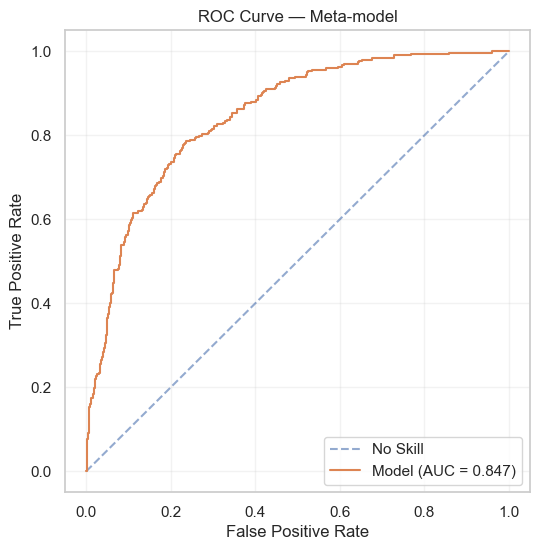

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve, roc_auc_score
from sklearn.linear_model import LogisticRegression

# ----- choose probabilities safely -----
proba = None

if "test_pred_log_reg_mean" in globals():
    proba = np.asarray(test_pred_log_reg_mean).ravel()
elif "proba_test" in globals():
    proba = np.asarray(proba_test).ravel()
else:
    if all(v in globals() for v in ("stack_X_train", "stack_X_test", "y_train")):
        SEED = globals().get("SEED", 42)
        lr = LogisticRegression(solver="liblinear", C=0.05, max_iter=3000,
                                random_state=SEED, n_jobs=-1)
        lr.fit(stack_X_train, np.asarray(y_train).ravel())
        proba = lr.predict_proba(stack_X_test)[:, 1]
    else:
        raise NameError("No probabilities found. Run meta-model cell first.")

# ----- check y_test -----
if "y_test" not in globals():
    raise NameError("'y_test' not found. Run your train/test split cell first.")

y_true = np.asarray(y_test).ravel()

# ----- ROC -----
fpr, tpr, _ = roc_curve(y_true, proba)
roc_auc = roc_auc_score(y_true, proba)

plt.figure(figsize=(6, 6))
plt.plot([0, 1], [0, 1], "--", label="No Skill", alpha=0.6)
plt.plot(fpr, tpr, label=f"Model (AUC = {roc_auc:.3f})")
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("ROC Curve — Meta-model")
plt.legend(loc="lower right")
plt.grid(alpha=0.25)
plt.show()


#### PR Curve

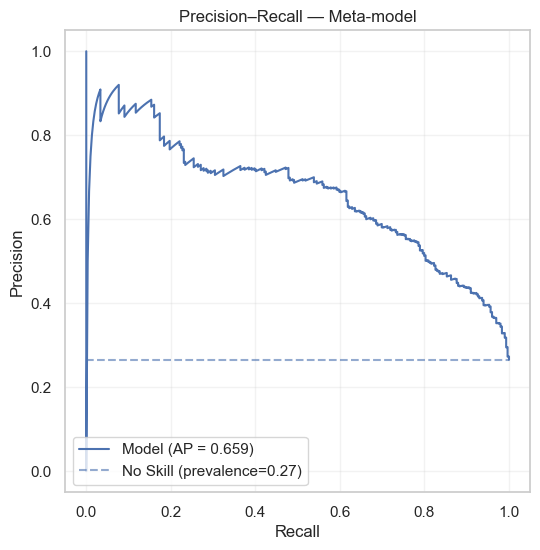

In [ ]:
from sklearn.metrics import precision_recall_curve, average_precision_score

# ----- reuse proba from previous cell -----
y_true = np.asarray(y_test).ravel()
prec, rec, _ = precision_recall_curve(y_true, proba)
ap = average_precision_score(y_true, proba)

plt.figure(figsize=(6, 6))
plt.plot(rec, prec, label=f"Model (AP = {ap:.3f})")
baseline = y_true.mean()
plt.hlines(baseline, 0, 1, linestyles="--", 
           label=f"No Skill (prevalence={baseline:.2f})", alpha=0.6)
plt.xlabel("Recall")
plt.ylabel("Precision")
plt.title("Precision–Recall — Meta-model")
plt.legend(loc="lower left")
plt.grid(alpha=0.25)
plt.show()


<a id='10.5.5'></a>
### 10.5.5 Stacking Ensemble Classic ML Models

**Model Evaluation :**

>logreg, cross-validation score - mean  : 0.804 std: (0.019)
>knn, cross-validation score - mean  : 0.759 std: (0.017)
>rforest, cross-validation score - mean  : 0.792 std: (0.018)
>etree, cross-validation score - mean  : 0.781 std: (0.017)
>svm, cross-validation score - mean  : 0.735 std: (0.001)
>stacking, cross-validation score - mean  : 0.806 std: (0.020)


<br>

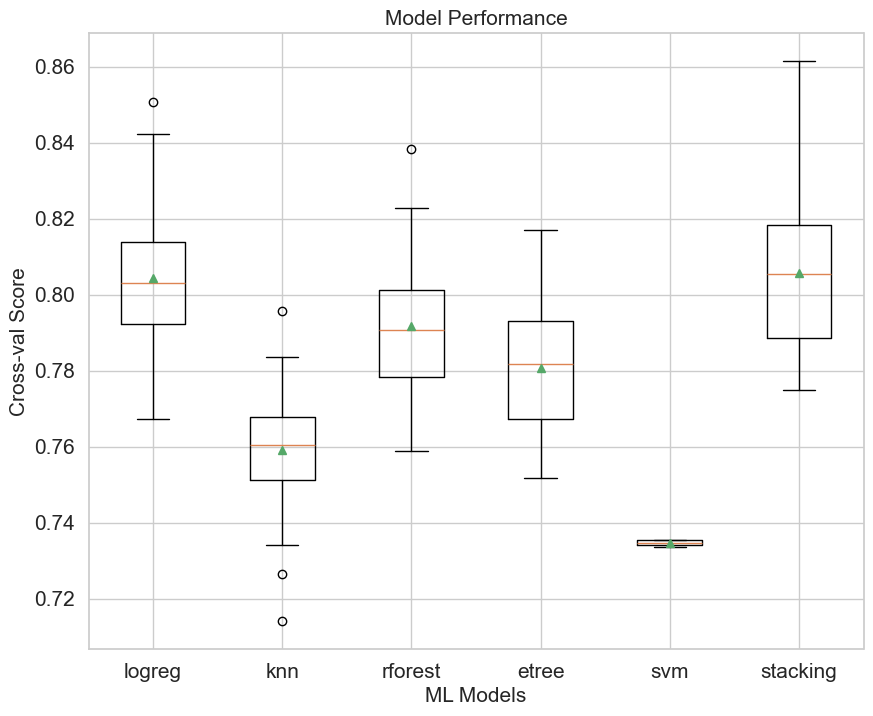

In [ ]:
# 5 fold stacking ensembling with 3 Repeated Stratified 10-Fold cross validation

# get a stacking ensemble of models
def get_stacking():
  # define the base models
  level0 = list()
  level0.append(('logreg', LogisticRegression()))
  level0.append(('knn', KNeighborsClassifier()))
  level0.append(('rforest', RandomForestClassifier()))
  level0.append(('etree', ExtraTreesClassifier()))
  level0.append(('svm', SVC()))

  # define meta learner model
  level1 = LogisticRegression()

  # define the stacking ensemble
  model = StackingClassifier(estimators=level0, final_estimator=level1, cv=5)
  return model
 
# get a list of models to evaluate
def get_models():
  models = dict()
  models['logreg'] = LogisticRegression()
  models['knn'] = KNeighborsClassifier()
  models['rforest'] = RandomForestClassifier()
  models['etree'] = ExtraTreesClassifier()
  models['svm'] = SVC()
  models['stacking'] = get_stacking()
  return models

# evaluate a give model using cross-validation
def evaluate_model(model, X, y):
	cv = RepeatedStratifiedKFold(n_splits=10, n_repeats=3, random_state=1)
	scores = cross_val_score(model, X, y, scoring='accuracy', cv=cv, n_jobs=-1, error_score='raise')
	return scores

# get the models to evaluate
models = get_models()

# evaluate the models and store results
results, names = list(), list()

printmd("**Model Evaluation :**")

for name, model in models.items():
	scores = evaluate_model(model, X, y)
	results.append(scores)
	names.append(name)
	print('>%s, cross-validation score - mean  : %.3f std: (%.3f)' % (name, np.mean(scores), np.std(scores)))
 
printmd("<br>")

# plot model performance for comparison
font_size = 15
plt.figure(figsize=(10,8))
plt.boxplot(results, labels=names, showmeans=True)

plt.title("Model Performance",  fontsize=font_size)
plt.xlabel("ML Models", fontsize=font_size)
plt.ylabel("Cross-val Score",  fontsize=font_size)
plt.xticks(fontsize=font_size)
plt.yticks(fontsize=font_size)

plt.show()


# credit : https://machinelearningmastery.com/stacking-ensemble-machine-learning-with-python

**Classic ML models perform poorly in comparison with Gradient Boosting models**